<a href="https://colab.research.google.com/github/FGalvao77/HR-Analytics---Prevendo-turnover-de-colaboradores/blob/main/HR_Analytics_Prevendo_turnover_de_colaboradores.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **HR Analytics - Prevendo `turnover` de colaboradores**

## **Carregando o conjunto de de dados**

In [ ]:
# carregando os dados direto de uma url
!wget 'https://raw.githubusercontent.com/FGalvao77/datasets/main/employee_data.csv'

--2021-12-07 23:38:59--  https://raw.githubusercontent.com/FGalvao77/datasets/main/employee_data.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 566778 (553K) [text/plain]
Saving to: ‘employee_data.csv.1’

employee_data.csv.1 100%[===================>] 553.49K  --.-KB/s    in 0.05s   

2021-12-07 23:38:59 (10.2 MB/s) - ‘employee_data.csv.1’ saved [566778/566778]



In [ ]:
# visualizando o diretório principal
%ls

employee_data.csv  employee_data.csv.1  sample_data/  turnover.sav


In [ ]:
# realizando a leitura do conjunto de dados
!head employee_data.csv

satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,sales,salary
0.38,0.53,2,157,3,0,1,0,sales,low
0.8,0.86,5,262,6,0,1,0,sales,medium
0.11,0.88,7,272,4,0,1,0,sales,medium
0.72,0.87,5,223,5,0,1,0,sales,low
0.37,0.52,2,159,3,0,1,0,sales,low
0.41,0.5,2,153,3,0,1,0,sales,low
0.1,0.77,6,247,4,0,1,0,sales,low
0.92,0.85,5,259,5,0,1,0,sales,low
0.89,1,5,224,5,0,1,0,sales,low


## **Importando as bibliotecas**

In [ ]:
# biblioteca para ignorar mensagens de alerta
import warnings
warnings.filterwarnings('ignore')

# import sys

# if not sys.warnoptions:
#     import warnings
#     warnings.simplefilter('ignore')

In [ ]:
# biblioteca para modelagem de dados
import pandas as pd

In [ ]:
# configurando a quantidade de casas decimais que serão exibidas
pd.options.display.float_format='{:,.3f}'.format

## **Leitura do conjunto de dados**

In [ ]:
# instanciando o conjunto de dados na variável "df"
df = pd.read_csv('employee_data.csv', sep=',')

# visualizando as 5 primeiras linhas do conjunto de dados
df.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,sales,salary
0,0.380,0.530,2,157,3,0,1,0,sales,low
1,0.800,0.860,5,262,6,0,1,0,sales,medium
2,0.110,0.880,7,272,4,0,1,0,sales,medium
3,0.720,0.870,5,223,5,0,1,0,sales,low
4,0.370,0.520,2,159,3,0,1,0,sales,low


## **Análise exploratória do conjunto de dados**

In [ ]:
# informações gerais sobre o conjunto de dados
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     14999 non-null  float64
 1   last_evaluation        14999 non-null  float64
 2   number_project         14999 non-null  int64  
 3   average_montly_hours   14999 non-null  int64  
 4   time_spend_company     14999 non-null  int64  
 5   Work_accident          14999 non-null  int64  
 6   left                   14999 non-null  int64  
 7   promotion_last_5years  14999 non-null  int64  
 8   sales                  14999 non-null  object 
 9   salary                 14999 non-null  object 
dtypes: float64(2), int64(6), object(2)
memory usage: 1.1+ MB


In [ ]:
# visualizando 5 amostras aleatórias do conjunto de dados
df.sample(5)

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,sales,salary
1020,0.740,0.870,5,258,5,0,1,0,accounting,low
2267,0.320,0.480,5,246,3,0,0,0,support,low
10299,0.760,0.980,4,258,3,0,0,0,RandD,low
11849,0.200,0.700,4,225,5,0,0,0,support,low
6869,0.350,0.810,6,256,3,0,0,0,RandD,medium


In [ ]:
# contabalizando a presença de valores duplicados
df.duplicated().sum()

3008

In [ ]:
# contabilizando o quanto os valores duplicados representa para a totalidade de observações presentes no conjunto de dados
df.duplicated().sum() / df.shape[0] * 100

20.05467031135409

In [ ]:
# removendo observações duplicadas
df.drop_duplicates(inplace=True, keep=False)

In [ ]:
# contabalizando a presença de valores duplicados
df.duplicated().sum()

0

In [ ]:
# contabilizando as instâncias únicas nos atributos
df.nunique()

satisfaction_level        92
last_evaluation           65
number_project             6
average_montly_hours     215
time_spend_company         5
Work_accident              2
left                       2
promotion_last_5years      2
sales                     10
salary                     3
dtype: int64

In [ ]:
# visualizando as instâncias únicas no atributo "sales"
df['sales'].unique()

array(['sales', 'accounting', 'hr', 'technical', 'support', 'management',
       'IT', 'product_mng', 'RandD', 'marketing'], dtype=object)

In [ ]:
# renomeando o atributo "sales" para "department"
df = df.rename(columns={'sales': 'department'})

In [ ]:
# nome dos atributos 
df.columns

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident', 'left',
       'promotion_last_5years', 'department', 'salary'],
      dtype='object')

In [ ]:
# contabilizando a presença de valores nulos
df.isnull().sum()

satisfaction_level       0
last_evaluation          0
number_project           0
average_montly_hours     0
time_spend_company       0
Work_accident            0
left                     0
promotion_last_5years    0
department               0
salary                   0
dtype: int64

In [ ]:
# verificando a presença de valores "NaN"
df.isna().sum().any()   # reposta do tipo boleana

False

In [ ]:
# explorando o atributo alvo
print(df['left'].unique(),                              # instâncias únicas presentes
      df['left'].value_counts(),                        # contabilizando a distribuição das instâncias
      df['left'].value_counts(normalize=True) * 100,    # frequência relativa das distribuição das instâncias
      sep='\n\n')

[1 0]

0    8572
1    1081
Name: left, dtype: int64

0   88.801
1   11.199
Name: left, dtype: float64


In [ ]:
# estatítisca descritiva
df.describe().T

,count,mean,std,min,25%,50%,75%,max
satisfaction_level,"9,653.000",0.643,0.234,0.090,0.500,0.670,0.830,1.000
last_evaluation,"9,653.000",0.717,0.166,0.360,0.570,0.720,0.860,1.000
number_project,"9,653.000",3.803,1.109,2.000,3.000,4.000,5.000,7.000
average_montly_hours,"9,653.000",199.994,47.815,96.000,159.000,199.000,242.000,310.000
time_spend_company,"9,653.000",3.193,1.054,2.000,2.000,3.000,4.000,6.000
Work_accident,"9,653.000",0.162,0.368,0.000,0.000,0.000,0.000,1.000
left,"9,653.000",0.112,0.315,0.000,0.000,0.000,0.000,1.000
promotion_last_5years,"9,653.000",0.010,0.097,0.000,0.000,0.000,0.000,1.000


In [ ]:
# visualizando as instâncias categóricas - único, top e frequência
df.describe(include='object')

,department,salary
count,9653,9653
unique,10,3
top,sales,low
freq,2532,4594


In [ ]:
# correlação entre as variáveis
df.corr()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years
satisfaction_level,1.000,0.087,-0.124,0.005,-0.232,0.021,-0.305,0.019
last_evaluation,0.087,1.000,0.201,0.199,0.078,-0.003,0.023,-0.007
number_project,-0.124,0.201,1.000,0.256,0.215,-0.006,0.041,0.011
average_montly_hours,0.005,0.199,0.256,1.000,0.096,-0.018,0.071,-0.013
time_spend_company,-0.232,0.078,0.215,0.096,1.000,-0.005,0.235,-0.007
Work_accident,0.021,-0.003,-0.006,-0.018,-0.005,1.000,-0.094,0.018
left,-0.305,0.023,0.041,0.071,0.235,-0.094,1.000,-0.028
promotion_last_5years,0.019,-0.007,0.011,-0.013,-0.007,0.018,-0.028,1.000


In [ ]:
# instalando a biblioteca "dataprep" para gerar relatório do conjunto de dados
!pip install dataprep

In [ ]:
# biblioteca para gerar relatório
from dataprep.eda import create_report

DataPrep Report
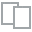
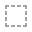
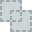
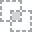
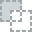
...
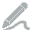
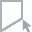
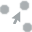
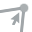
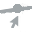

In [ ]:
# com a função "create_report()" e, passando como argumento o objeto (df) para geração do relatório
create_report(df)

## **Visualização gráfica exploratória do conjunto de dados**

In [ ]:
# biblioteca para visualização gráfica
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [ ]:
# visualizando os atribitos numéricos contínuos
print('Variáveis Contínuas:')
continous_vars = df.describe().columns

print(continous_vars)

Variáveis Contínuas:
Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident', 'left',
       'promotion_last_5years'],
      dtype='object')


Visualização das Variáveis Contínuas


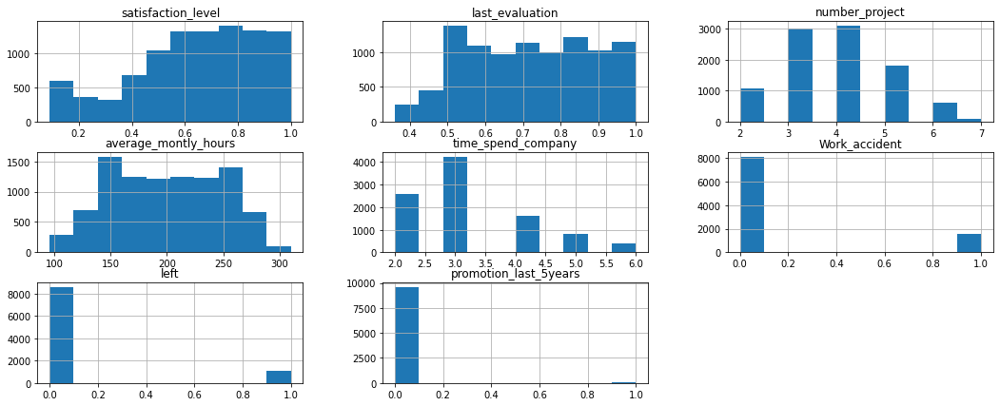

In [ ]:
# gráfico de histograma dos atribitos numéricos contínuos
print('Visualização das Variáveis Contínuas')
df.hist(column=continous_vars, figsize=(18, 7))
plt.show();

In [ ]:
# visualizando os atribitos categóricos
print('Variáveis Categóricas:')
categorical_vars = df.describe(include=[object]).columns


print(categorical_vars)

Variáveis Categóricas:
Index(['department', 'salary'], dtype='object')


Visualização das Variáveis Categóricas


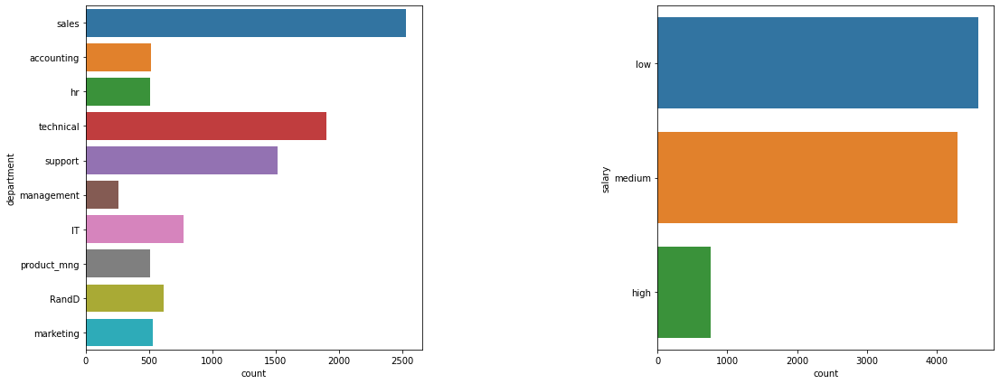

In [ ]:
# gráfico de histograma dos atribitos categóricos
print('Visualização das Variáveis Categóricas')

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

plt.subplots_adjust(left=None, bottom=None, 
                    right=None, top=None, 
                    wspace=0.7, hspace=0.3)

for i, ax in enumerate(axes.ravel()):
    if i > 10:
        ax.set_visible(False)
        continue

    sns.countplot(y=categorical_vars[i], 
                  data=df, ax=ax)

plt.show();

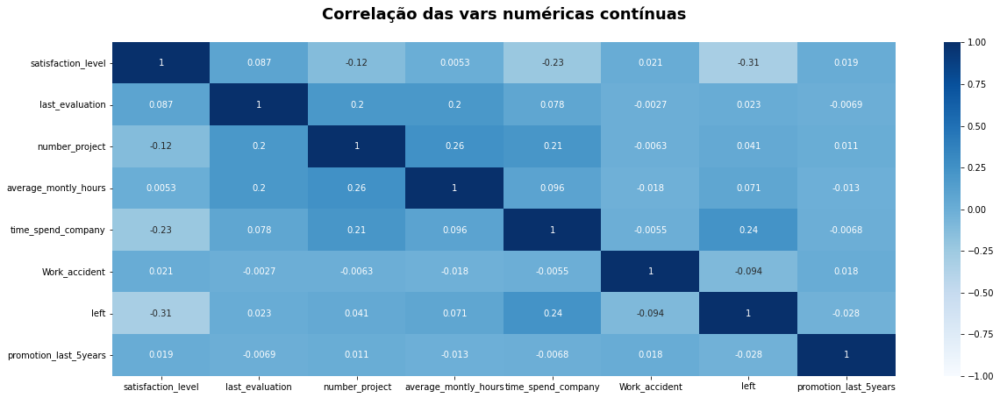

In [ ]:
# gráfico de calor da correlação das variáveis numéricas
plt.figure(figsize=(20, 7))

sns.heatmap(df.corr(method='pearson'), cmap='Blues', vmin=-1., 
            annot=True, vmax=1.)

plt.title('Correlação das vars numéricas contínuas\n', 
          {'fontsize': 18,'fontweight': 'bold'});

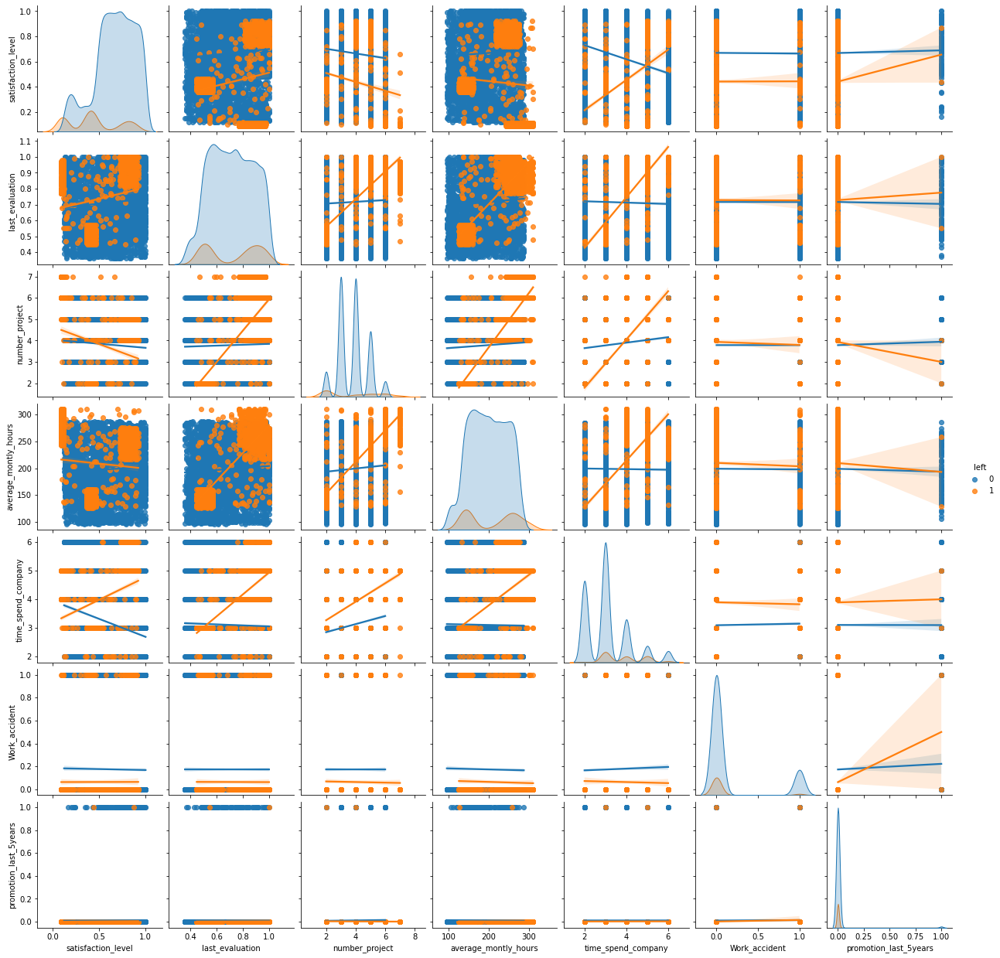

In [ ]:
# gerando diversos gráficos
sns.pairplot(df, hue='left', kind='reg');

## **Pré-processamento do conjunto de dados**

In [ ]:
# nome dos atributos
df.columns

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident', 'left',
       'promotion_last_5years', 'department', 'salary'],
      dtype='object')

In [ ]:
# contabilizando as instâncias únicas do atributo "department"
df['department'].value_counts()

sales          2532
technical      1899
support        1515
IT              774
RandD           616
marketing       526
accounting      517
product_mng     508
hr              508
management      258
Name: department, dtype: int64

In [ ]:
# biblioteca para modelagem matemática
import numpy as np

In [ ]:
# renomenando as instâncias "support" e "IT" para "technical"
df['department'] = np.where(df['department'] == 'support', 'technical', df['department'])
df['department'] = np.where(df['department'] == 'IT', 'technical', df['department'])

In [ ]:
# visualizando as instâncias únicas no atributo "department"
df['department'].unique()

array(['sales', 'accounting', 'hr', 'technical', 'management',
       'product_mng', 'RandD', 'marketing'], dtype=object)

In [ ]:
# contabilizando as instâncias únicas do atributo "department"
df['department'].value_counts()

technical      4188
sales          2532
RandD           616
marketing       526
accounting      517
product_mng     508
hr              508
management      258
Name: department, dtype: int64

In [ ]:
# tipo de dado nos atributos
df.dtypes

satisfaction_level       float64
last_evaluation          float64
number_project             int64
average_montly_hours       int64
time_spend_company         int64
Work_accident              int64
left                       int64
promotion_last_5years      int64
department                object
salary                    object
dtype: object

In [ ]:
# realizando "one-hot" nas variáveis categóricas
cat_vars = df.describe(include=[object]).columns

for var in cat_vars:
    cat_list = 'var' +  '_' + var
    cat_list = pd.get_dummies(df[var], prefix=var)
    df2 = df.join(cat_list)
    df = df2

In [ ]:
# contabilizando e visualizando os novos atributos
len(df.columns), df.columns

(21, Index(['satisfaction_level', 'last_evaluation', 'number_project',
        'average_montly_hours', 'time_spend_company', 'Work_accident', 'left',
        'promotion_last_5years', 'department', 'salary', 'department_RandD',
        'department_accounting', 'department_hr', 'department_management',
        'department_marketing', 'department_product_mng', 'department_sales',
        'department_technical', 'salary_high', 'salary_low', 'salary_medium'],
       dtype='object'))

In [ ]:
# estatística descritiva
df.describe().T

,count,mean,std,min,25%,50%,75%,max
satisfaction_level,"9,653.000",0.643,0.234,0.090,0.500,0.670,0.830,1.000
last_evaluation,"9,653.000",0.717,0.166,0.360,0.570,0.720,0.860,1.000
number_project,"9,653.000",3.803,1.109,2.000,3.000,4.000,5.000,7.000
average_montly_hours,"9,653.000",199.994,47.815,96.000,159.000,199.000,242.000,310.000
time_spend_company,"9,653.000",3.193,1.054,2.000,2.000,3.000,4.000,6.000
Work_accident,"9,653.000",0.162,0.368,0.000,0.000,0.000,0.000,1.000
left,"9,653.000",0.112,0.315,0.000,0.000,0.000,0.000,1.000
promotion_last_5years,"9,653.000",0.010,0.097,0.000,0.000,0.000,0.000,1.000
department_RandD,"9,653.000",0.064,0.244,0.000,0.000,0.000,0.000,1.000
department_accounting,"9,653.000",0.054,0.225,0.000,0.000,0.000,0.000,1.000


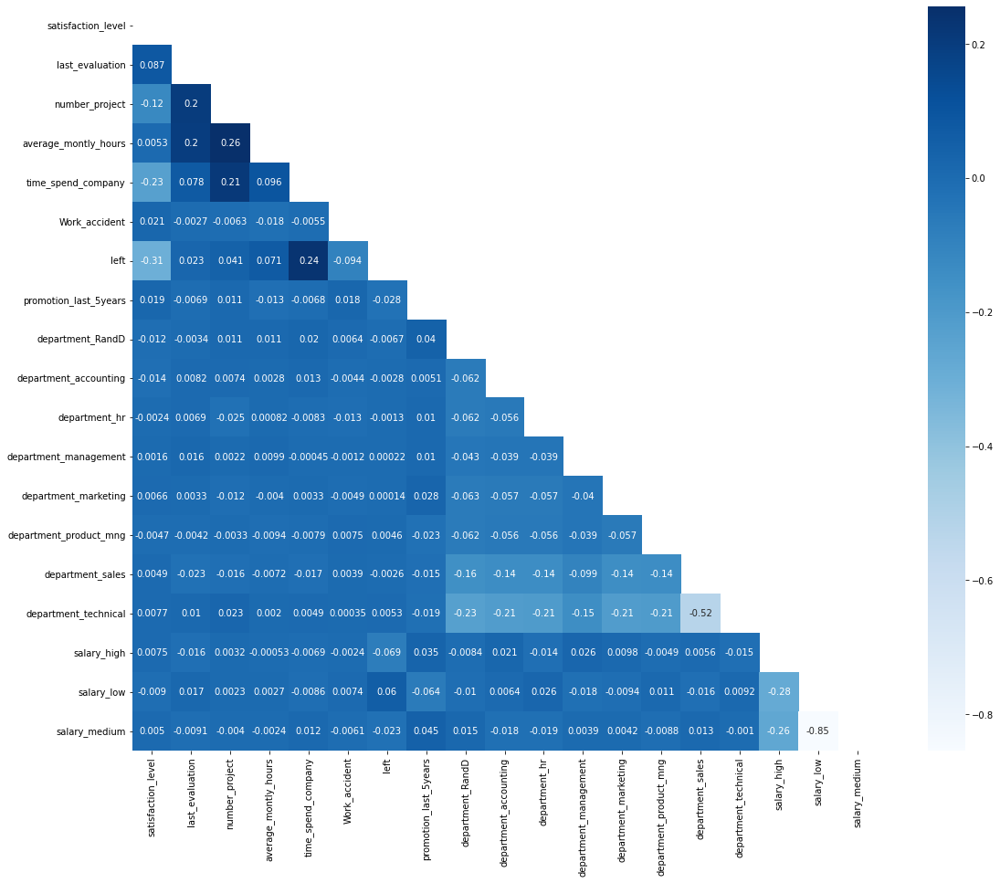

In [ ]:
# plotando gráfico de calor da correlação entre as variáveis
correlation_matrix = df.corr()

mask = np.zeros_like(correlation_matrix)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=[20, 15])

sns.heatmap(
    correlation_matrix,
    annot=True,
    mask=mask,
    square=True,
    cmap='Blues'
);

In [ ]:
# removendo as variáveis "department" e "salary"
# df.drop(df.columns[['department', 'salary']], axis=1, inplace=True)
df.drop(df.columns[[8, 9]], axis=1, inplace=True)

# visualizando os atributos
df.columns.values

array(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident',
       'left', 'promotion_last_5years', 'department_RandD',
       'department_accounting', 'department_hr', 'department_management',
       'department_marketing', 'department_product_mng',
       'department_sales', 'department_technical', 'salary_high',
       'salary_low', 'salary_medium'], dtype=object)

In [ ]:
# df_vars = df.columns.values.tolist()

# X = df.drop(['left'], axis=1)
# y = [i for i in df_vars if i not in X]

In [ ]:
# X

In [ ]:
# y

In [ ]:
# separando as variáveis explicativas (X) e a resposta (y)
df_vars = df.columns.values.tolist()

y = ['left']
X = [i for i in df_vars if i not in y]

In [ ]:
# visualizando os atributos das variáveis X e y
X, y

(['satisfaction_level',
  'last_evaluation',
  'number_project',
  'average_montly_hours',
  'time_spend_company',
  'Work_accident',
  'promotion_last_5years',
  'department_RandD',
  'department_accounting',
  'department_hr',
  'department_management',
  'department_marketing',
  'department_product_mng',
  'department_sales',
  'department_technical',
  'salary_high',
  'salary_low',
  'salary_medium'],
 ['left'])

## **Seleção de atributos**

In [ ]:
# biblioteca para aplicação da regressão logística
from sklearn.linear_model import LogisticRegression

In [ ]:
# biblioteca para seleção de atributos
from sklearn.feature_selection import RFE

In [ ]:
# instanciando o modelo de regressão logística
model_lr = LogisticRegression()

# aplicando o modelo de seleção de atributos
rfe = RFE(estimator=model_lr, n_features_to_select=10, step=1)

In [ ]:
# visualizando os atributos mais importantes para o modelo
rfe = rfe.fit(df[X], df[y])

print(
    rfe.support_,
    rfe.ranking_,
    sep='\n\n'
)

[ True False  True False  True  True  True  True  True False False False
 False False False  True  True  True]

[1 9 1 8 1 1 1 1 1 2 3 7 4 6 5 1 1 1]


In [ ]:
# visualizando os atributos da variável X
X

['satisfaction_level',
 'last_evaluation',
 'number_project',
 'average_montly_hours',
 'time_spend_company',
 'Work_accident',
 'promotion_last_5years',
 'department_RandD',
 'department_accounting',
 'department_hr',
 'department_management',
 'department_marketing',
 'department_product_mng',
 'department_sales',
 'department_technical',
 'salary_high',
 'salary_low',
 'salary_medium']

In [ ]:
# instanciando os atributos mais importantes
cols = [
        'satisfaction_level', 
        'number_project', 
        'time_spend_company',
        'Work_accident',
        'promotion_last_5years',
        'department_RandD',
        'department_accounting',
        'salary_high',
        'salary_low',
        'salary_medium'
]

In [ ]:
# instanciando os atributos selecionados na variável X
X = df[cols]

# instanciando a variável resposta
y = df['left']

In [ ]:
# visualizando os atributos presentes na variável X
X

,satisfaction_level,number_project,time_spend_company,Work_accident,promotion_last_5years,department_RandD,department_accounting,salary_high,salary_low,salary_medium
783,0.360,2,3,0,0,0,0,0,1,0
784,0.440,2,3,0,0,0,0,0,1,0
785,0.850,5,5,0,0,0,0,0,1,0
786,0.780,5,5,0,0,0,0,0,1,0
787,0.390,2,3,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...
10567,0.750,4,4,0,0,0,0,0,1,0
10568,0.910,6,3,0,0,0,0,0,1,0
10569,0.840,4,3,0,0,0,0,0,1,0
10570,0.640,4,3,0,0,0,0,0,1,0


In [ ]:
# visualizando a variável resposta
y

783      1
784      1
785      1
786      1
787      1
        ..
10567    0
10568    0
10569    0
10570    0
10571    0
Name: left, Length: 9653, dtype: int64

In [ ]:
# biblioteca para particionamento dos dados
from sklearn.model_selection import train_test_split

In [ ]:
# particionando os dados em subconjuntos - treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.3,
                                                    random_state=42)

## **Aplicação dos modelos**

### **Logistic Regression**

In [ ]:
# biblioteca para aplicação da regressão logística
from sklearn.linear_model import LogisticRegression

In [ ]:
# instanciando o modelo no objeto "logReg_model" e em seguida treinando-o com os subconjuntos de dados de treino
logReg_model = LogisticRegression()
logReg_model.fit(X_train, y_train)

LogisticRegression()

In [ ]:
# biblioteca para avalição da acurácia do modelo
from sklearn.metrics import accuracy_score

In [ ]:
# visualizando a acurácia do modelo
print('Logist Regression\nAccuracy = {:.3f}'.format(accuracy_score(y_test, logReg_model.predict(X_test))))

Logist Regression
Accuracy = 0.868


In [ ]:
# biblioteca para validação cruzada
from sklearn.model_selection import cross_val_score

In [ ]:
# acurácia média do modelo "logReg_model" após a validação cruzada
accuracies_logReg = cross_val_score(estimator=logReg_model, X=X_train, y=y_train, cv=10)

print('Accuracy (mean): %', accuracies_logReg.mean() * 100)
print('std: %', accuracies_logReg.std() * 100)

Accuracy (mean): % 87.12445759368836
std: % 0.4390483170442604


In [ ]:
# score MAE (média) do modelo "logReg_model" após a validação cruzada
scores_logReg = cross_val_score(logReg_model, X_train, y_train, scoring='neg_mean_absolute_error', cv=10)
print('MAE (mean): %', scores_logReg.mean())

MAE (mean): % -0.12875542406311635


In [ ]:
# biblioteca para erro médio absoluto e erro médio quadrático
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [ ]:
# visualizando o resultado das métricas - MAE, RMSE e RMSE
mae_logReg = mean_absolute_error(logReg_model.predict(X_test), y_test)
mse_logReg = mean_squared_error(logReg_model.predict(X_test), y_test)
rmse_logReg = np.sqrt(mse_logReg)

print('Mean Absolute Error (MAE): %.3f' % mae_logReg)
print('Mean Squared Error (MSE): %.3f' % mse_logReg)
print('Root Mean Squared Error (RMSE): %.3f' % rmse_logReg)

Mean Absolute Error (MAE): 0.132
Mean Squared Error (MSE): 0.132
Root Mean Squared Error (RMSE): 0.364


### **Random Forest**

In [ ]:
# biblioteca de floresta aleatória
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# instanciando o modelo no objeto "randFor_model" e em seguida treinando-o com os subconjuntos de dados de treino
randFor_model = RandomForestClassifier(class_weight='balanced')  # aplicando balanceamento das classes
randFor_model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced')

In [ ]:
# visualizando a acurácia do modelo
print('Random Forest\nAccuracy = {:.3f}'.format(accuracy_score(y_test, randFor_model.predict(X_test))))

Random Forest
Accuracy = 0.971


In [ ]:
# acurácia média do modelo "randFor_model" após a validação cruzada
accuracies_randFor = cross_val_score(estimator=randFor_model, X=X_train, y=y_train, cv=10)

print('Accuracy (mean): %', accuracies_randFor.mean() * 100)
print('std: %', accuracies_randFor.std() * 100)

Accuracy (mean): % 96.9658338812185
std: % 0.5869338782338289


In [ ]:
# score MAE (média) do modelo "randFor_model" após a validação cruzada
scores_randFor = cross_val_score(randFor_model, X_train, y_train, scoring='neg_mean_absolute_error', cv=10)
print('MAE (mean): %', scores_randFor.mean())

MAE (mean): % -0.03019373219373219


In [ ]:
# visualizando o resultado das métricas - MAE, RMSE e RMSE
mae_randFor = mean_absolute_error(randFor_model.predict(X_test), y_test)
mse_randFor = mean_squared_error(randFor_model.predict(X_test), y_test)
rmse_randFor = np.sqrt(mse_randFor)

print('Mean Absolute Error (MAE): %.3f' % mae_randFor)
print('Mean Squared Error (MSE): %.3f' % mse_randFor)
print('Root Mean Squared Error (RMSE): %.3f' % rmse_randFor)

Mean Absolute Error (MAE): 0.029
Mean Squared Error (MSE): 0.029
Root Mean Squared Error (RMSE): 0.169


### **XG Boosting**

In [ ]:
# biblioteca de "gradient boosting"
from xgboost import XGBClassifier

In [ ]:
# instanciando o modelo no objeto "xgb_model" e em seguida treinando-o com os subconjuntos de dados de treino
xgb_model = XGBClassifier(n_estimators=5000, learning_rate=0.8, max_depth=7)
xgb_model.fit(X_train, y_train)

XGBClassifier(learning_rate=0.8, max_depth=7, n_estimators=5000)

In [ ]:
# visualizando a acurácia do modelo
print('XGBClassifier\nAccuracy = {:.3f}'.format(accuracy_score(y_test, xgb_model.predict(X_test))))

XGBClassifier
Accuracy = 0.968


In [ ]:
# acurácia média do modelo "xgb_model" após a validação cruzada
accuracies_xgb = cross_val_score(estimator=xgb_model, X=X_train, y=y_train, cv=10)

print('Accuracy (mean): %', accuracies_xgb.mean() * 100)
print('std: %', accuracies_xgb.std() * 100)

Accuracy (mean): % 96.72912557527941
std: % 0.605607458914508


In [ ]:
# score MAE (média) do modelo "xgb_model" após a validação cruzada
scores_xgb = cross_val_score(xgb_model, X_train, y_train, scoring='neg_mean_absolute_error', cv=10)
print('MAE (mean): %', scores_xgb.mean())

MAE (mean): % -0.03270874424720579


In [ ]:
# visualizando o resultado das métricas - MAE, RMSE e RMSE
mae_xgb = mean_absolute_error(xgb_model.predict(X_test), y_test)
mse_xgb = mean_squared_error(xgb_model.predict(X_test), y_test)
rmse_xgb = np.sqrt(mse_xgb)

print('Mean Absolute Error (MAE): %.3f' % mae_randFor)
print('Mean Squared Error (MSE): %.3f' % mse_randFor)
print('Root Mean Squared Error (RMSE): %.3f' % rmse_randFor)

Mean Absolute Error (MAE): 0.029
Mean Squared Error (MSE): 0.029
Root Mean Squared Error (RMSE): 0.169


## **Relatório final dos modelos**

In [ ]:
# biblioteca para relatório 
from sklearn.metrics import classification_report

In [ ]:
# relatório do modelo randFor_model
print(classification_report(y_test, randFor_model.predict(X_test)))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98      2560
           1       0.87      0.89      0.88       336

    accuracy                           0.97      2896
   macro avg       0.93      0.93      0.93      2896
weighted avg       0.97      0.97      0.97      2896



In [ ]:
# biblioteca para gráfico da matriz de confusão
from sklearn.metrics import confusion_matrix

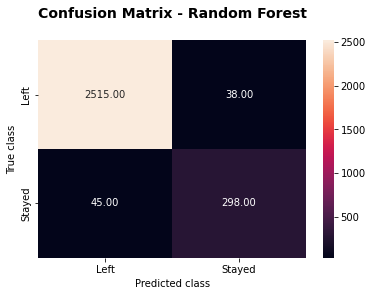

In [ ]:
# gráfico da matriz de confusão do modelo randFor_model
randFor_pred = randFor_model.predict(X_test)
randFor_cm = confusion_matrix(randFor_pred, y_test)

sns.heatmap(randFor_cm, annot=True, fmt='.2f', 
            xticklabels=['Left', 'Stayed'], 
            yticklabels=['Left', 'Stayed'])

plt.xlabel('Predicted class')
plt.ylabel('True class')
plt.title('Confusion Matrix - Random Forest\n', 
          {'fontsize': 14,'fontweight': 'bold'});

In [ ]:
# relatório do modelo logReg_model
print(classification_report(y_test, logReg_model.predict(X_test)))

              precision    recall  f1-score   support

           0       0.88      0.98      0.93      2560
           1       0.10      0.02      0.03       336

    accuracy                           0.87      2896
   macro avg       0.49      0.50      0.48      2896
weighted avg       0.79      0.87      0.82      2896



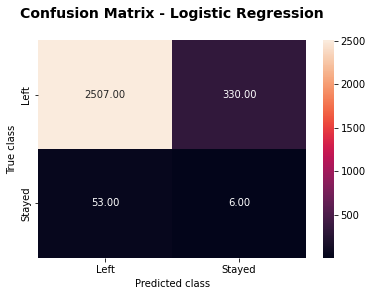

In [ ]:
# gráfico da matriz de confusão do modelo logReg_pred
logReg_pred = logReg_model.predict(X_test)
logReg_cm = confusion_matrix(logReg_pred, y_test)

sns.heatmap(logReg_cm, annot=True, fmt='.2f', 
            xticklabels=['Left', 'Stayed'], 
            yticklabels=['Left', 'Stayed'])

plt.xlabel('Predicted class')
plt.ylabel('True class')
plt.title('Confusion Matrix - Logistic Regression\n', 
          {'fontsize': 14,'fontweight': 'bold'});

In [ ]:
# relatório do modelo xgb_model
print(classification_report(y_test, xgb_model.predict(X_test)))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2560
           1       0.85      0.88      0.86       336

    accuracy                           0.97      2896
   macro avg       0.92      0.93      0.92      2896
weighted avg       0.97      0.97      0.97      2896



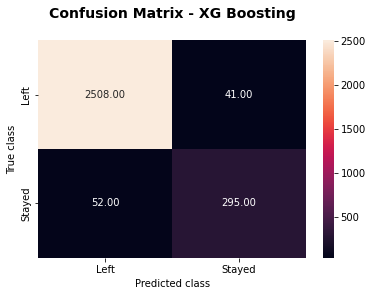

In [ ]:
# gráfico da matriz de confusão do modelo xgb_model
xgb_pred = xgb_model.predict(X_test)
xgb_cm = confusion_matrix(xgb_pred, y_test)

sns.heatmap(xgb_cm, annot=True, fmt='.2f', 
            xticklabels=['Left', 'Stayed'], 
            yticklabels=['Left', 'Stayed'])

plt.xlabel('Predicted class')
plt.ylabel('True class')
plt.title('Confusion Matrix - XG Boosting\n', 
          {'fontsize': 14,'fontweight': 'bold'});

## **Área AUC e curva ROC**

In [ ]:
# bilioteca para área e a curva ROC
from sklearn.metrics import roc_auc_score, roc_curve

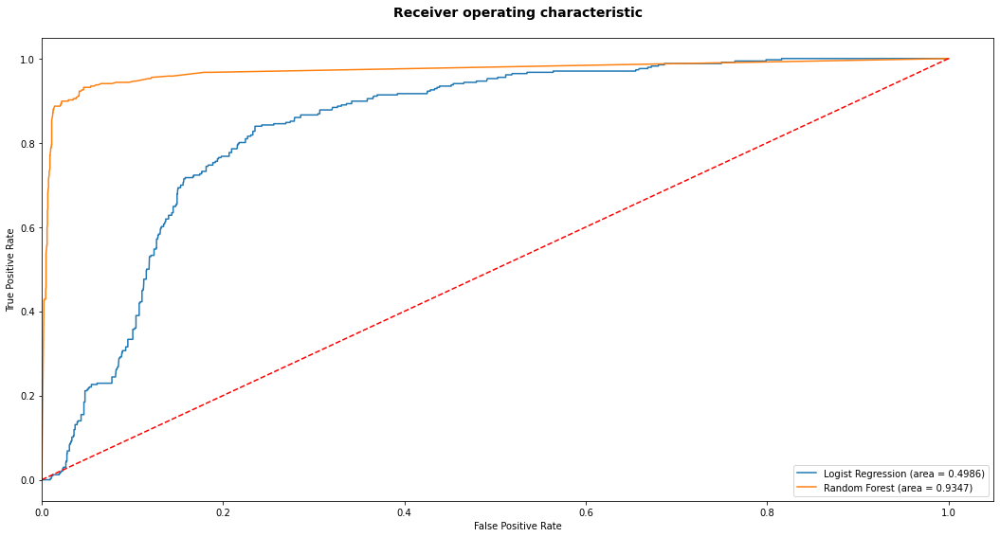

In [ ]:
# plotando o gráfico ROC AUC

# regressão logística
logReg_roc_auc = roc_auc_score(y_test, logReg_model.predict(X_test))
fpr_lr, tpr_lr, thresholds_lr = roc_curve(y_test, logReg_model.predict_proba(X_test)[:, 1])

# floresta aleatória
randFor_roc_auc = roc_auc_score(y_test, randFor_model.predict(X_test))
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, randFor_model.predict_proba(X_test)[:, 1])

plt.figure(figsize=(18, 9))

plt.plot(fpr_lr, tpr_lr, label='Logist Regression (area = %0.4f)' % logReg_roc_auc)
plt.plot(fpr_rf, tpr_rf, label='Random Forest (area = %0.4f)' % randFor_roc_auc)

plt.plot([0, 1], [0, 1], 'r--')

plt.xlim([0.0, 1.0])
plt.xlim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.title('Receiver operating characteristic\n', 
          {'fontsize': 14,'fontweight': 'bold'})

plt.legend(loc='lower right')

plt.show();

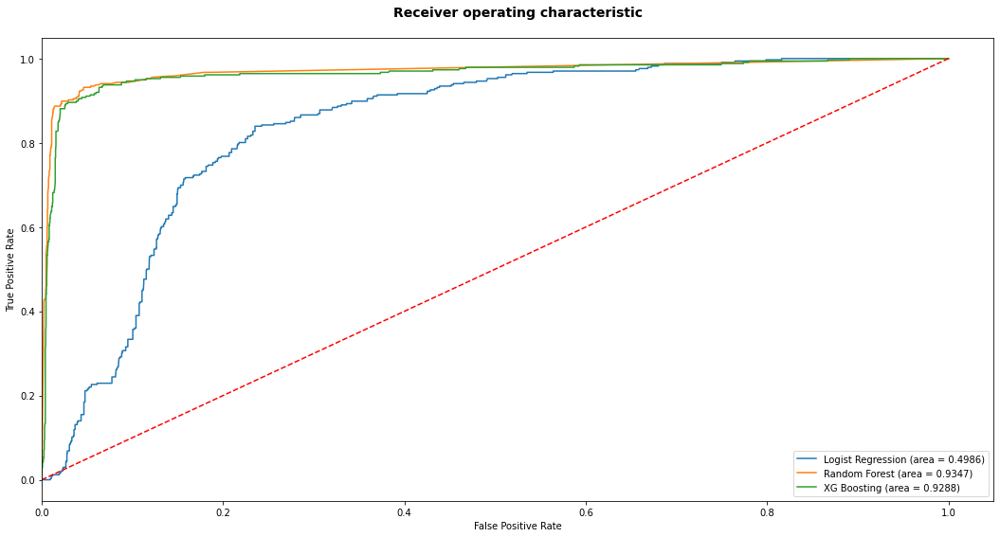

In [ ]:
# plotando o gráfico ROC AUC

# regressão logística
logReg_roc_auc = roc_auc_score(y_test, logReg_model.predict(X_test))
fpr_lr, tpr_lr, thresholds_lr = roc_curve(y_test, logReg_model.predict_proba(X_test)[:, 1])

# floresta alaetória
randFor_roc_auc = roc_auc_score(y_test, randFor_model.predict(X_test))
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, randFor_model.predict_proba(X_test)[:, 1])

# xg boosting
xgb_roc_auc = roc_auc_score(y_test, xgb_model.predict(X_test))
fpr_xgb, tpr_xgb, thresholds_xgb = roc_curve(y_test, xgb_model.predict_proba(X_test)[:, 1])

plt.figure(figsize=(18, 9))

plt.plot(fpr_lr, tpr_lr, label='Logist Regression (area = %0.4f)' % logReg_roc_auc)
plt.plot(fpr_rf, tpr_rf, label='Random Forest (area = %0.4f)' % randFor_roc_auc)
plt.plot(fpr_xgb, tpr_xgb, label='XG Boosting (area = %0.4f)' % xgb_roc_auc)

plt.plot([0, 1], [0, 1], 'r--')

plt.xlim([0.0, 1.0])
plt.xlim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.title('Receiver operating characteristic\n', 
          {'fontsize': 14,'fontweight': 'bold'})

plt.legend(loc='lower right')

plt.show();

> A _curva de caracteristica de operação do receptor_ (`ROC` - Receiver operating characteristic) é uma ferramenta padrão usada com classificadores binários. 

A linha pontilhada vermelha representa a curva ROC de um classificador puramente aleatório;
- um bom classificador fica o mais longe dessa linha e, mais próximo ao canto superior.

Portanto, como podemos visualizar, o modelo de floresta aleatória obteve a melhor área sob a curva.

## **Importância das variáveis**

In [ ]:
# importâncias dos atributos para o modelo preditivo
feat_labels = np.array([
                        'satisfaction_level', 
                        'number_project', 
                        'time_spend_company',
                        'Work_accident',
                        'promotion_last_5years',
                        'department_RandD',
                        'department_accounting',
                        'salary_high',
                        'salary_low',
                        'salary_medium'
])

importance = randFor_model.feature_importances_
feat_idx_by_importance = importance.argsort()

for idx in feat_idx_by_importance:
    print('{}: {:.4f}%'.format(feat_labels[idx], (importance[idx] * 100.0)))

promotion_last_5years: 0.1406%
department_accounting: 0.4260%
salary_medium: 0.5730%
department_RandD: 0.6449%
salary_high: 0.6721%
salary_low: 0.6926%
Work_accident: 1.3956%
number_project: 19.6179%
time_spend_company: 32.2165%
satisfaction_level: 43.6208%


> De acordo com o nosso modelo de classificação `Random Forest`, os aspectos acima mostram as características mais importantes que irão influenciar a sáida do colaborador da empresa, em ordem decrescente.

In [ ]:
# percentual de importância dos atributos e seus respectivos índices
importance * 100, feat_idx_by_importance

(array([43.62083708, 19.61786432, 32.2165424 ,  1.39559373,  0.14059734,
         0.64494311,  0.42599138,  0.67207403,  0.69255443,  0.57300219]),
 array([4, 6, 9, 5, 7, 8, 3, 1, 2, 0]))

In [ ]:
# instanciando as features de maior importância para a predição do nosso target
feats = pd.Series(randFor_model.feature_importances_, index=X_train.columns)

In [ ]:
# ordenando do maior para o menor
feats.sort_values(inplace=True)

In [ ]:
# imprimindo as features de maior importância
feats.sort_values()*100

promotion_last_5years    0.141
department_accounting    0.426
salary_medium            0.573
department_RandD         0.645
salary_high              0.672
salary_low               0.693
Work_accident            1.396
number_project          19.618
time_spend_company      32.217
satisfaction_level      43.621
dtype: float64

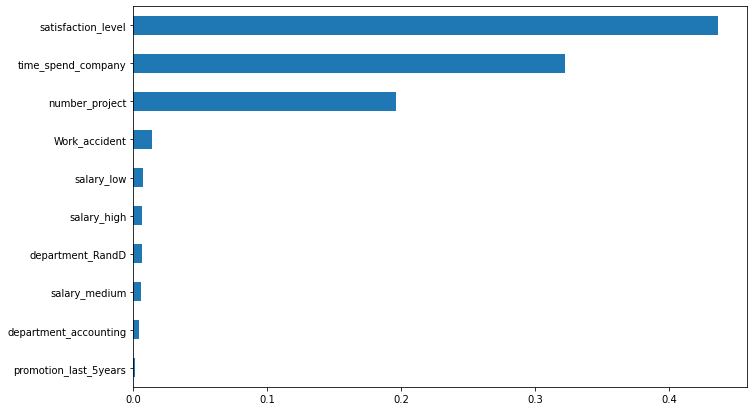

In [ ]:
# visualizando de forma gráfica com auxílio do gráfico de barras das features de maior importância
feats.plot(kind='barh', figsize=(11, 7));

> Chegamos à conclusão que as variáveis acima no gráfico são as que mais explica o `turnover`.

In [ ]:
# visualizando a porcentagem de "explicação" para a variável alvo
pd.DataFrame(feats.sort_values()*100, columns=['Percentual de explicação'])

,Percentual de explicação
promotion_last_5years,0.141
department_accounting,0.426
salary_medium,0.573
department_RandD,0.645
salary_high,0.672
salary_low,0.693
Work_accident,1.396
number_project,19.618
time_spend_company,32.217
satisfaction_level,43.621


## **Salvando o modelo**

In [ ]:
# biblioteca para aplicação do modelo 
import pickle

In [ ]:
# salvando o modelo escolhido em um arquivo
pickle.dump(randFor_model, 
            open('turnover.sav', mode='wb'))  # "wb" - write binary

In [ ]:
# instanciando o modelo no objeto "arquivo"
arquivo = open('turnover.sav', mode='rb')    # "rb" - read binary

# realizando a leitura do modelo
modelo = pickle.load(arquivo)

print(modelo)   # visualizando o modelo

RandomForestClassifier(class_weight='balanced')


## **Outros**

In [ ]:
# visualizando a versão do Python utilizado neste notebook
from platform import python_version
print(f'Versão Python: {python_version()}')

Versão Python: 3.7.12


In [ ]:
# instalando a biblioteca "watermark"
!pip install -q -U watermark 
# esse pacote é usado para gravar as versões dos pacotes usados neste notebook

In [ ]:
# versões das bibliotecas utilizadas neste notebook
%reload_ext watermark
%watermark -a 'Fernando Galvão | HR Analytics - Prevendo turnover de colaboradores #2021' --iversions

Author: Fernando Galvão | HR Analytics - Prevendo turnover de colaboradores #2021

numpy     : 1.19.5
matplotlib: 3.2.2
seaborn   : 0.11.2
pandas    : 1.1.5
IPython   : 5.5.0

